In [ ]:
# !pip install torch

In [ ]:
# !pip install torchvision

In [20]:
import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import datasets, transforms
import matplotlib.pyplot as plt

In [15]:
model = models.resnet50(pretrained=True)
model = nn.Sequential(*list(model.children())[:-2])
model.eval()
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3),  # Convert to RGB
    transforms.ToTensor(),
])

data_path = 'data/train/'
dataset = datasets.ImageFolder(root=data_path, transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)

In [16]:
def register_hooks(model):
    activations = {}

    def hook_fn(module, input, output, layer_name):
        activations[layer_name] = output.detach()

    for layer_name, layer in model.named_children():
        hook = layer.register_forward_hook(lambda self, input, output, ln=layer_name: hook_fn(self, input, output, ln))

    return activations, hook

In [25]:
def visualize_layer_output(layer_name, activation):
    num_channels_to_visualize = min(5, activation.shape[1])
    _, axes = plt.subplots(1, num_channels_to_visualize, figsize=(15, 3))

    for i in range(num_channels_to_visualize):
        # Choose a channel to visualize
        vis_image = activation[0, i].cpu().numpy()

        # Normalize for display
        vis_image = (vis_image - vis_image.min()) / (vis_image.max() - vis_image.min())

        # Display the visualization for each channel
        axes[i].imshow(vis_image, cmap='viridis')
        axes[i].set_title(f"Channel: {i}")

    plt.suptitle(f"Layer: {layer_name}")
    plt.show()

Layer: 0, Shape: torch.Size([1, 64, 112, 112])


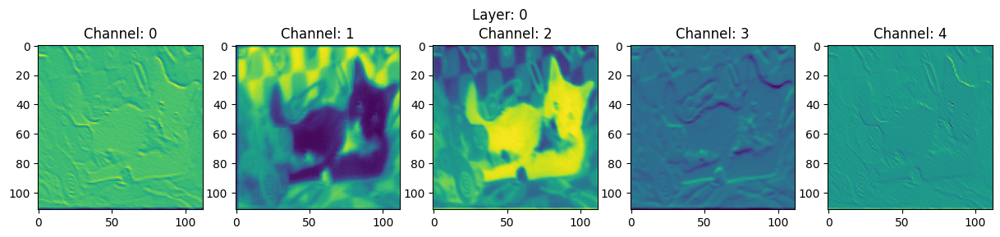

Layer: 1, Shape: torch.Size([1, 64, 112, 112])


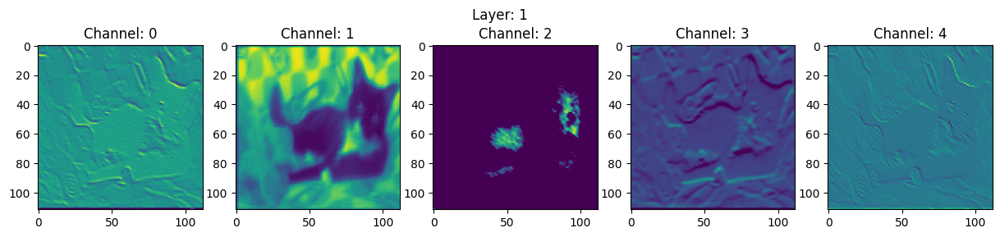

Layer: 2, Shape: torch.Size([1, 64, 112, 112])


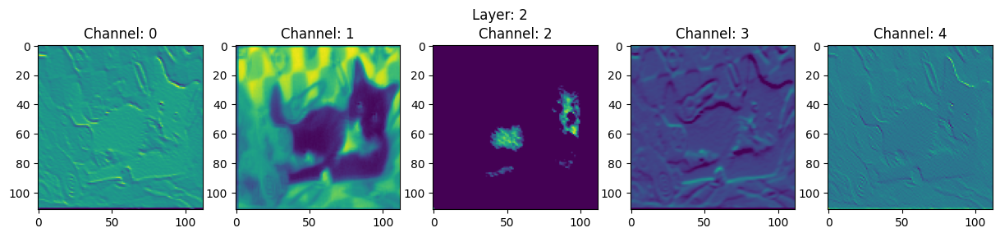

Layer: 3, Shape: torch.Size([1, 64, 56, 56])


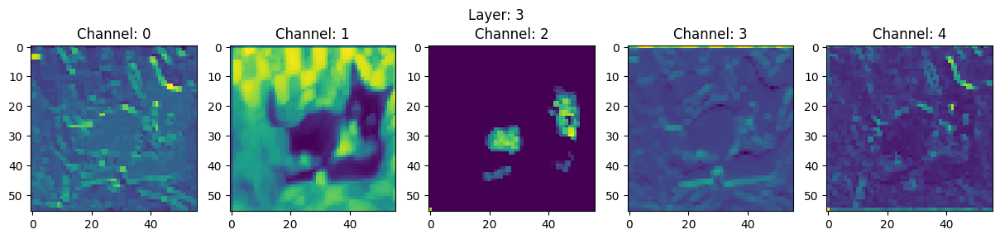

Layer: 4, Shape: torch.Size([1, 256, 56, 56])


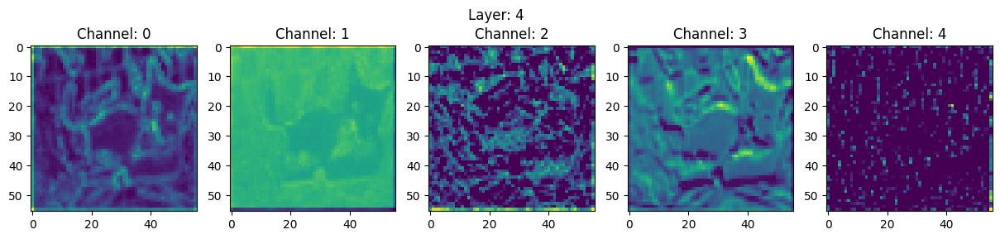

Layer: 5, Shape: torch.Size([1, 512, 28, 28])


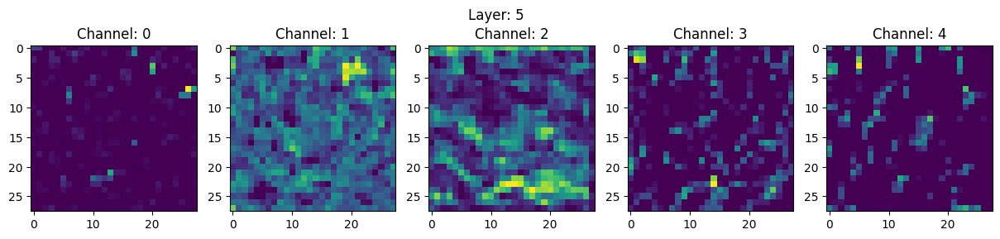

Layer: 6, Shape: torch.Size([1, 1024, 14, 14])


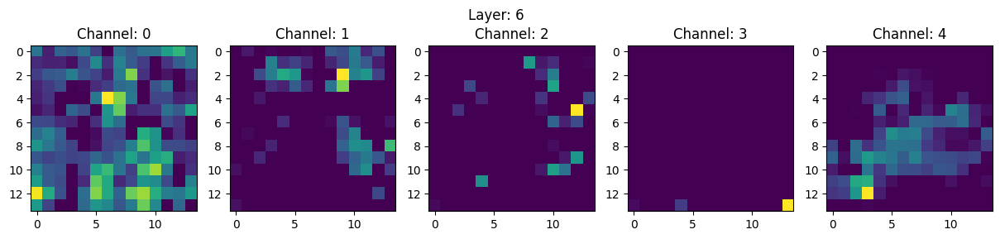

Layer: 7, Shape: torch.Size([1, 2048, 7, 7])


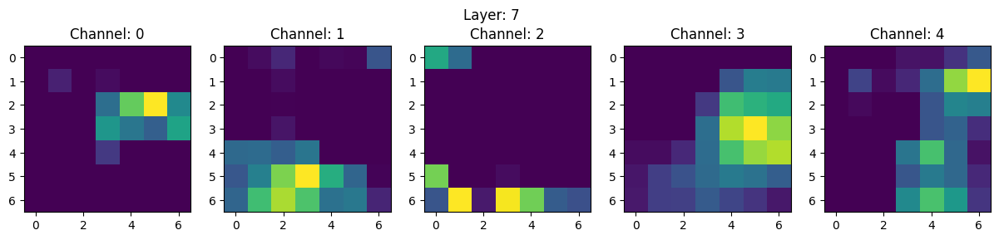

Layer: 0, Shape: torch.Size([1, 64, 112, 112])


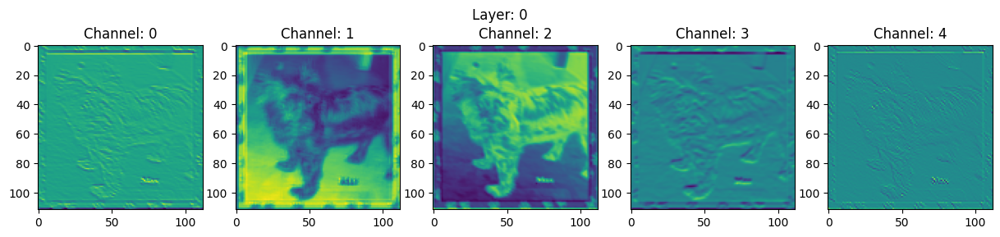

Layer: 1, Shape: torch.Size([1, 64, 112, 112])


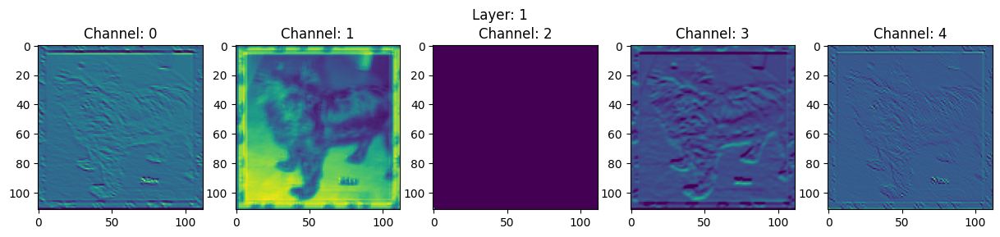

Layer: 2, Shape: torch.Size([1, 64, 112, 112])


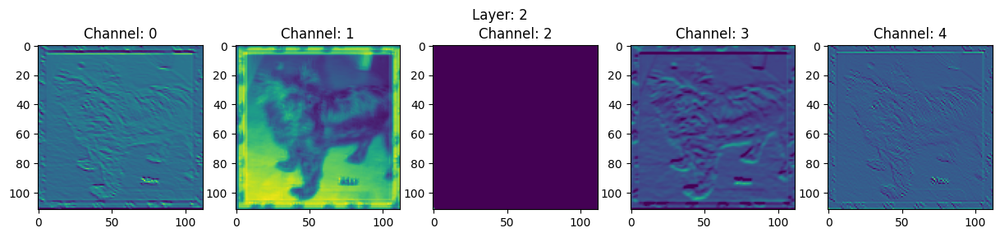

Layer: 3, Shape: torch.Size([1, 64, 56, 56])


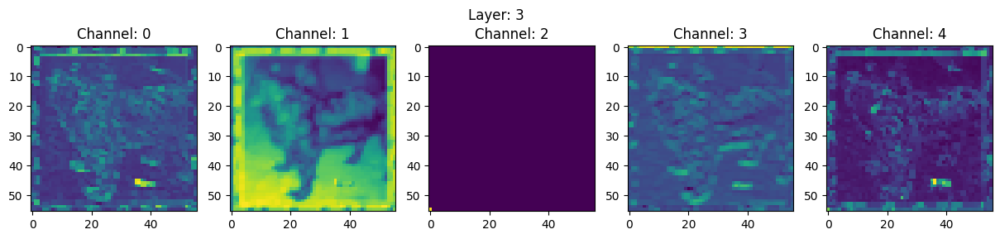

Layer: 4, Shape: torch.Size([1, 256, 56, 56])


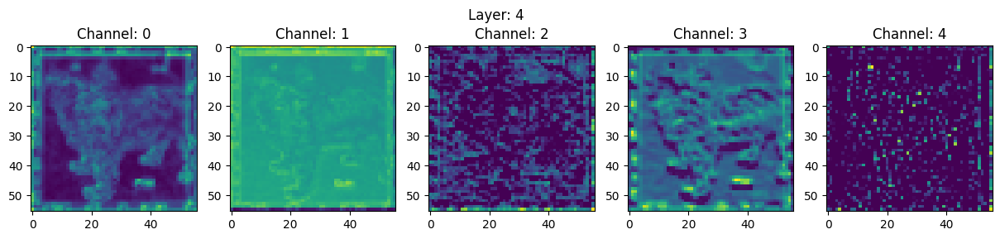

Layer: 5, Shape: torch.Size([1, 512, 28, 28])


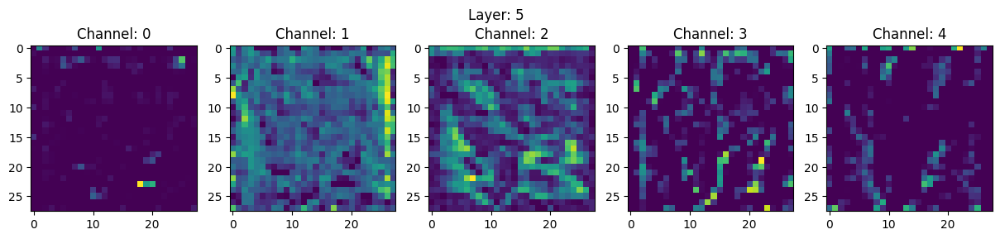

Layer: 6, Shape: torch.Size([1, 1024, 14, 14])


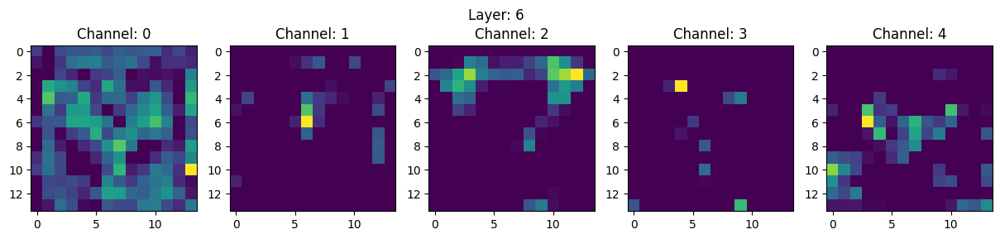

Layer: 7, Shape: torch.Size([1, 2048, 7, 7])


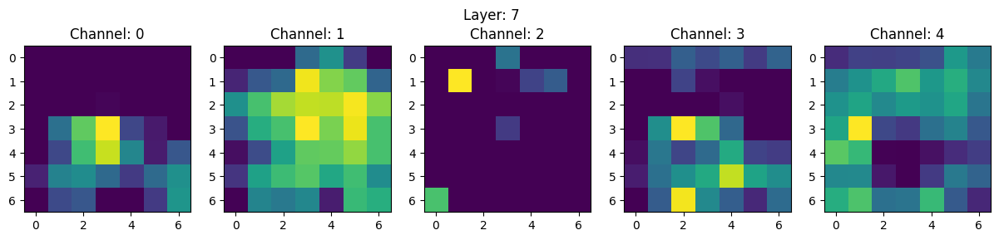

Layer: 0, Shape: torch.Size([1, 64, 112, 112])


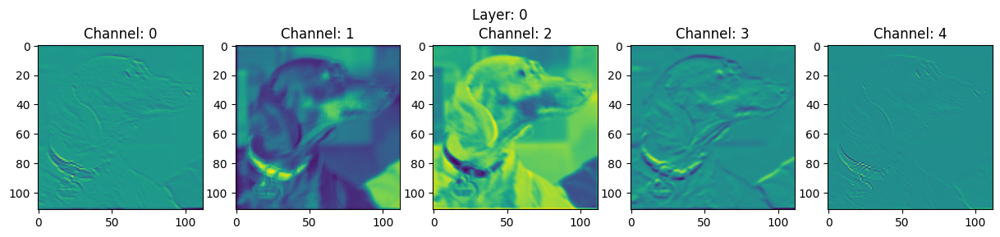

Layer: 1, Shape: torch.Size([1, 64, 112, 112])


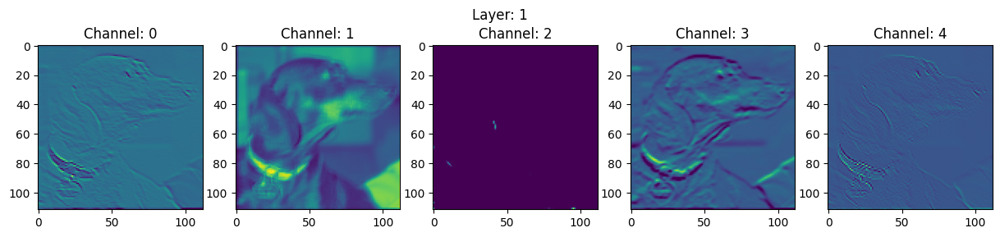

Layer: 2, Shape: torch.Size([1, 64, 112, 112])


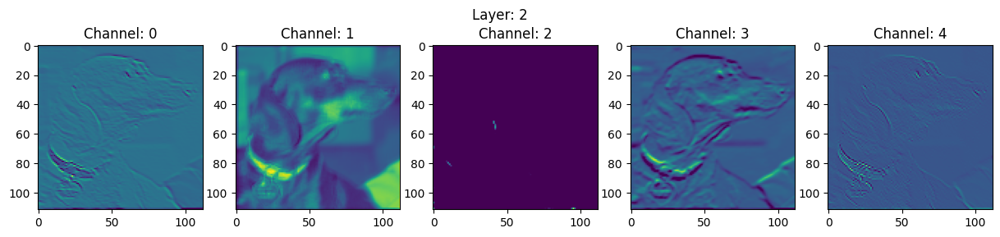

Layer: 3, Shape: torch.Size([1, 64, 56, 56])


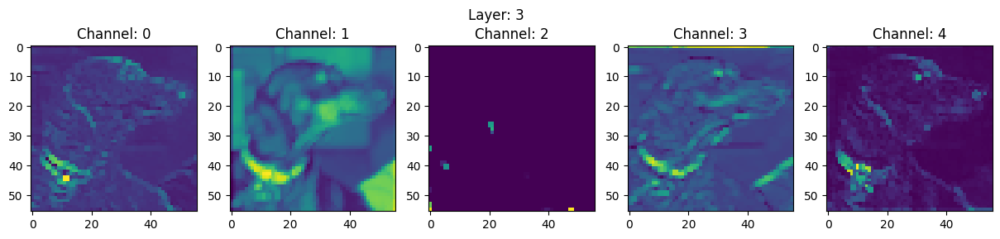

Layer: 4, Shape: torch.Size([1, 256, 56, 56])


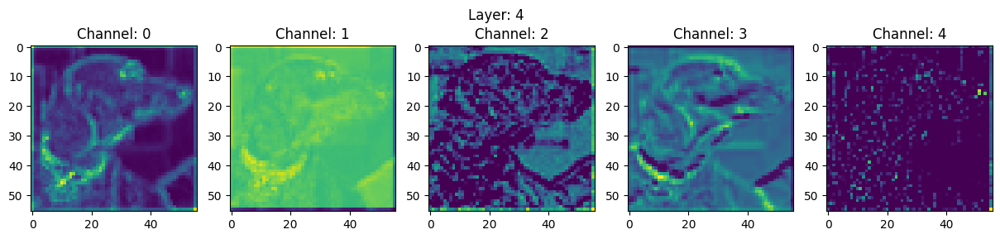

Layer: 5, Shape: torch.Size([1, 512, 28, 28])


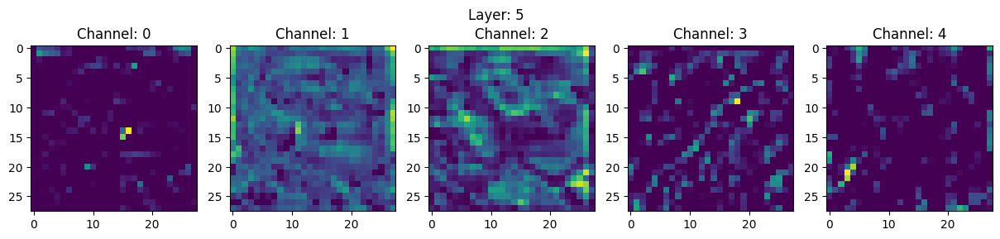

Layer: 6, Shape: torch.Size([1, 1024, 14, 14])


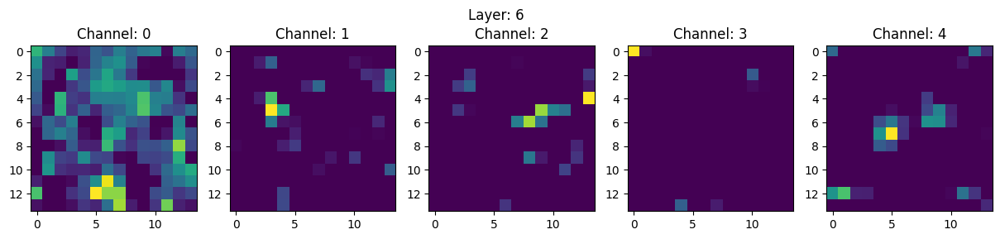

Layer: 7, Shape: torch.Size([1, 2048, 7, 7])


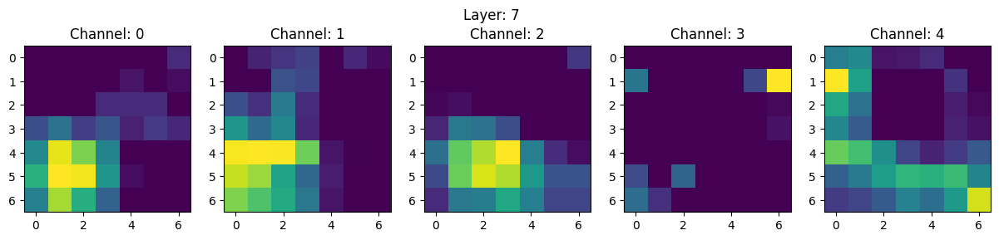

Layer: 0, Shape: torch.Size([1, 64, 112, 112])


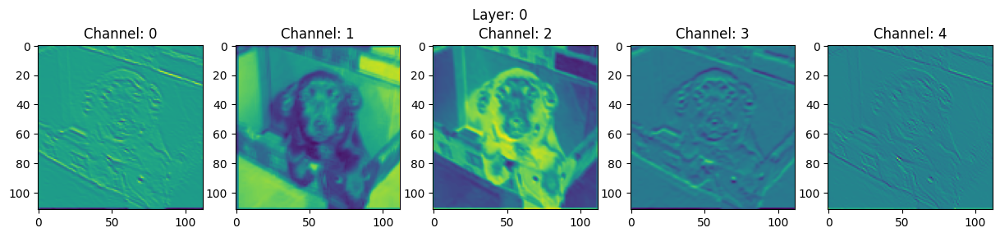

Layer: 1, Shape: torch.Size([1, 64, 112, 112])


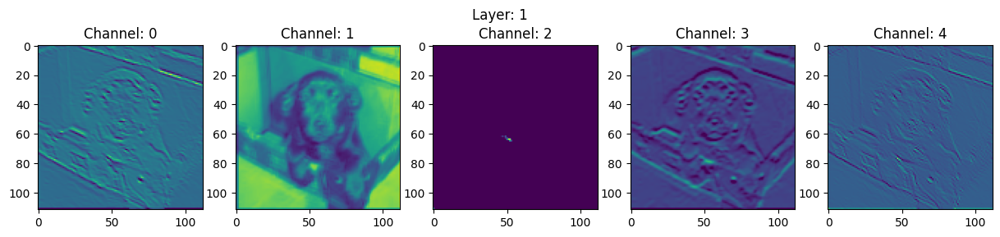

Layer: 2, Shape: torch.Size([1, 64, 112, 112])


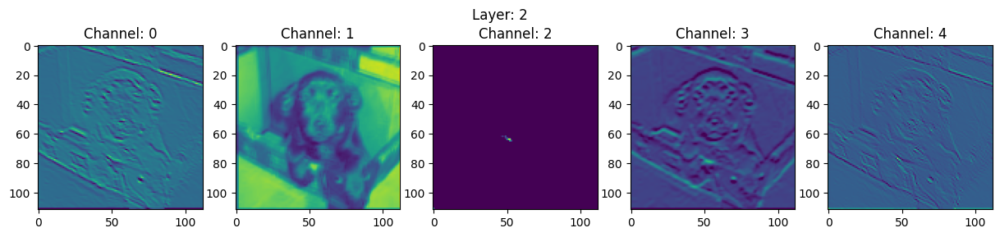

Layer: 3, Shape: torch.Size([1, 64, 56, 56])


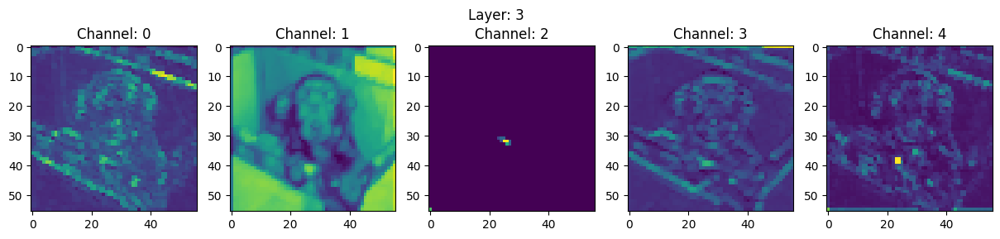

Layer: 4, Shape: torch.Size([1, 256, 56, 56])


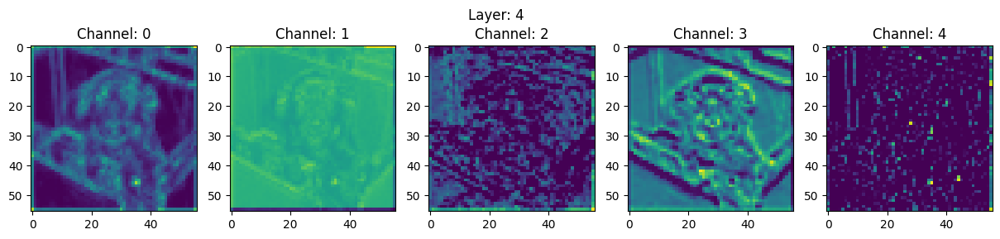

Layer: 5, Shape: torch.Size([1, 512, 28, 28])


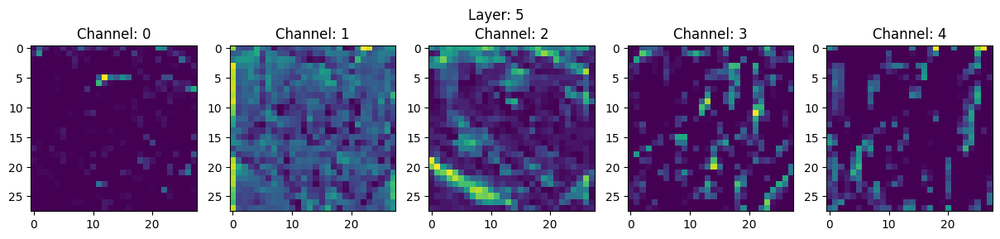

Layer: 6, Shape: torch.Size([1, 1024, 14, 14])


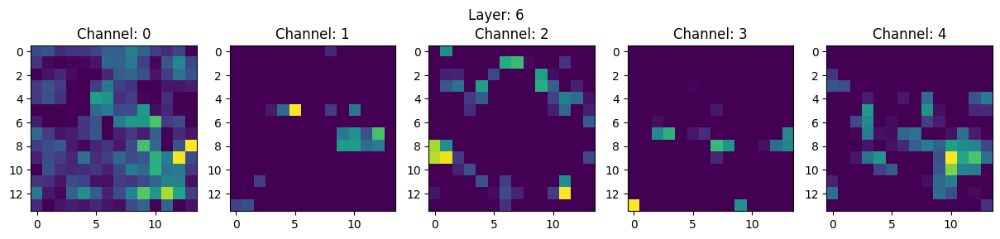

Layer: 7, Shape: torch.Size([1, 2048, 7, 7])


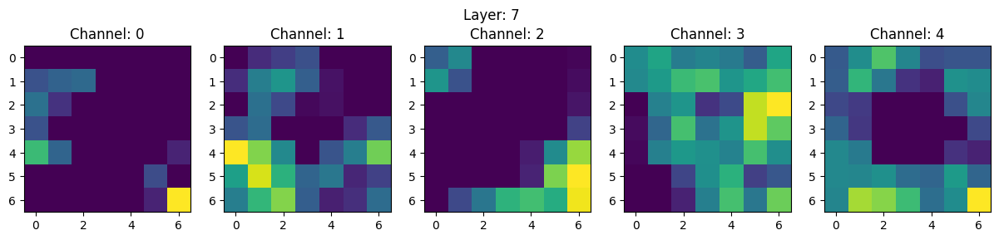

Layer: 0, Shape: torch.Size([1, 64, 112, 112])


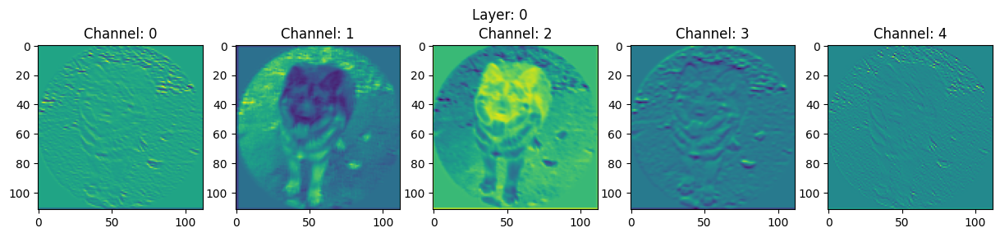

Layer: 1, Shape: torch.Size([1, 64, 112, 112])


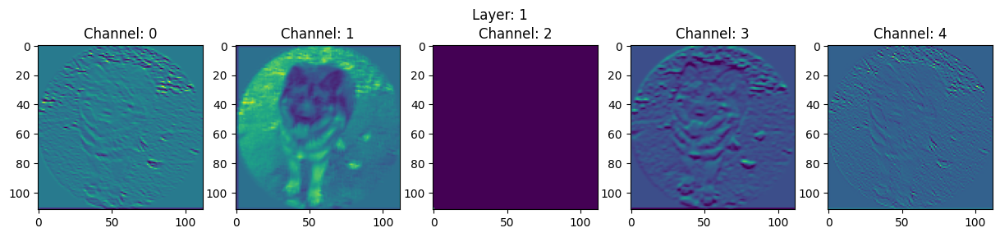

Layer: 2, Shape: torch.Size([1, 64, 112, 112])


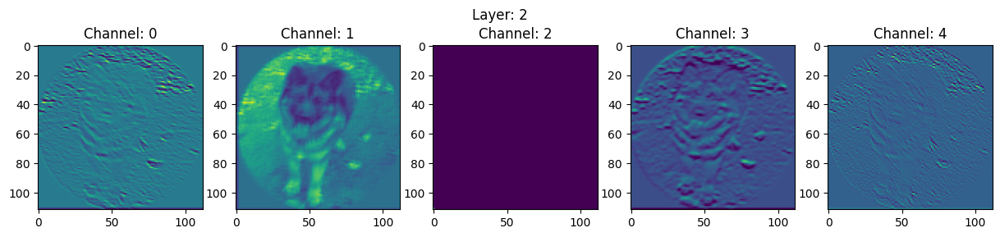

Layer: 3, Shape: torch.Size([1, 64, 56, 56])


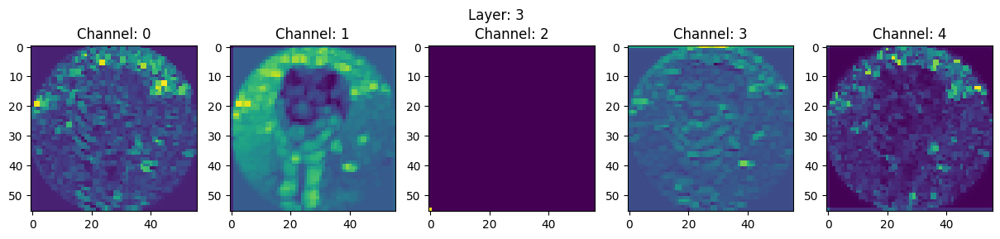

Layer: 4, Shape: torch.Size([1, 256, 56, 56])


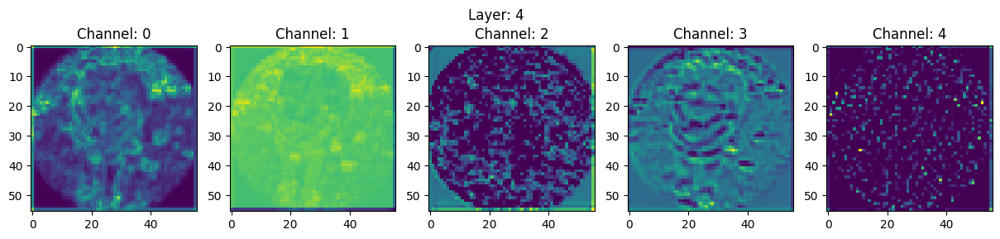

Layer: 5, Shape: torch.Size([1, 512, 28, 28])


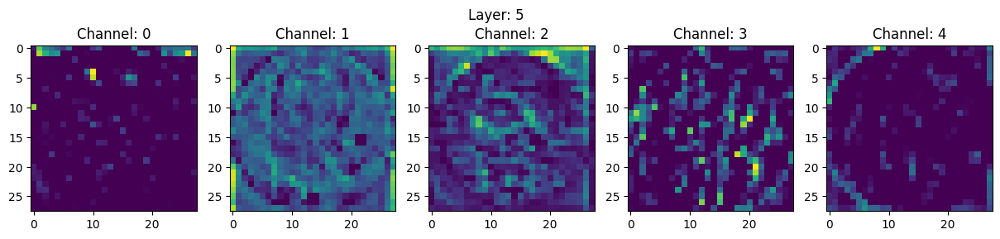

Layer: 6, Shape: torch.Size([1, 1024, 14, 14])


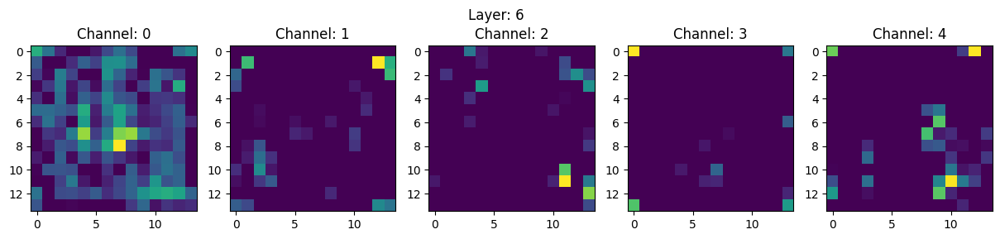

Layer: 7, Shape: torch.Size([1, 2048, 7, 7])


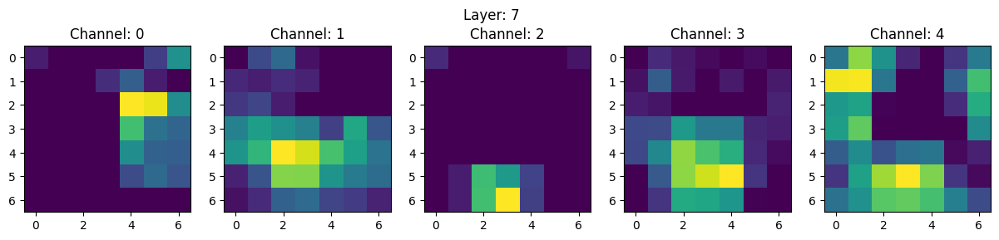

Layer: 0, Shape: torch.Size([1, 64, 112, 112])


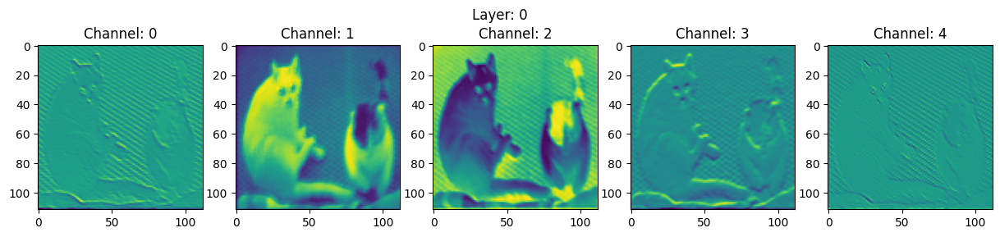

Layer: 1, Shape: torch.Size([1, 64, 112, 112])


C:\Users\afxwo\AppData\Local\Temp\ipykernel_13508\1575643271.py:12: RuntimeWarning: invalid value encountered in divide
  vis_image = (vis_image - vis_image.min()) / (vis_image.max() - vis_image.min())


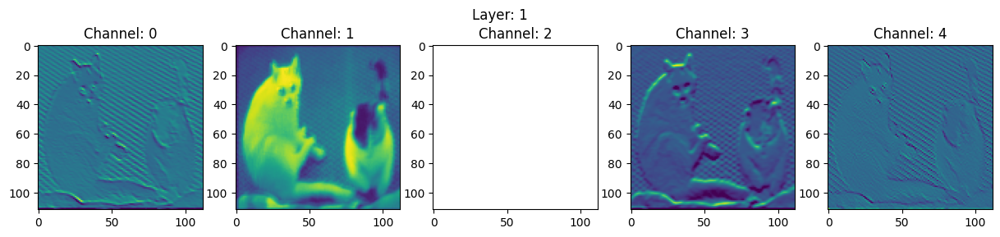

Layer: 2, Shape: torch.Size([1, 64, 112, 112])


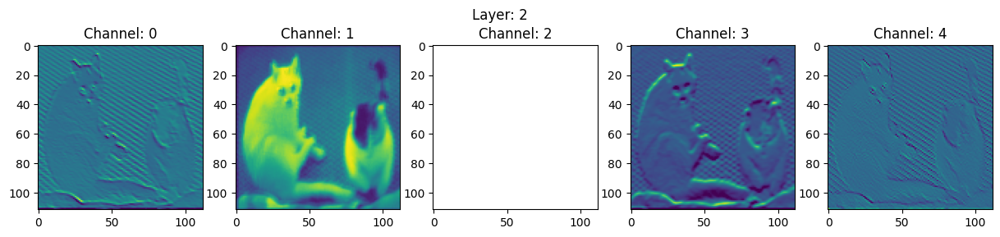

Layer: 3, Shape: torch.Size([1, 64, 56, 56])


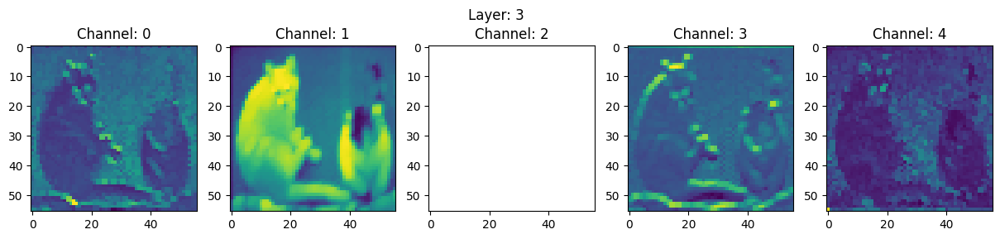

Layer: 4, Shape: torch.Size([1, 256, 56, 56])


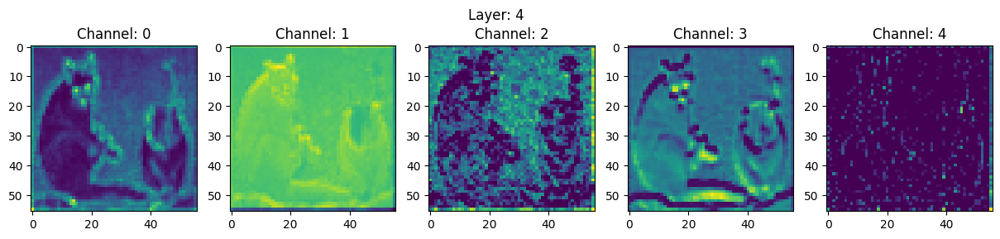

Layer: 5, Shape: torch.Size([1, 512, 28, 28])


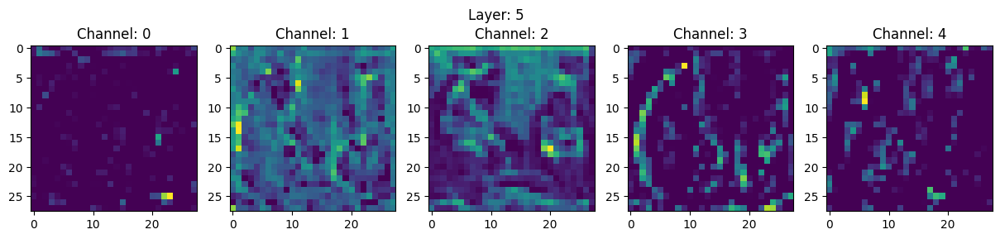

Layer: 6, Shape: torch.Size([1, 1024, 14, 14])


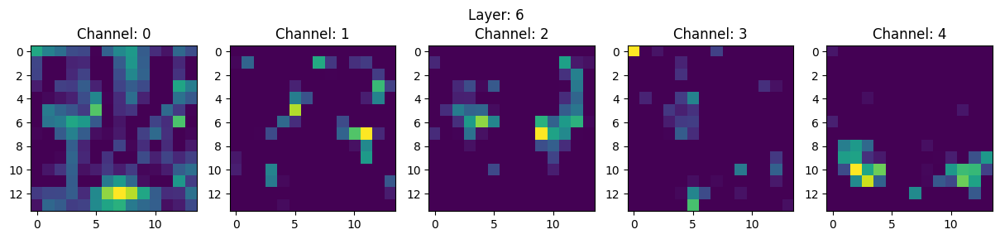

Layer: 7, Shape: torch.Size([1, 2048, 7, 7])


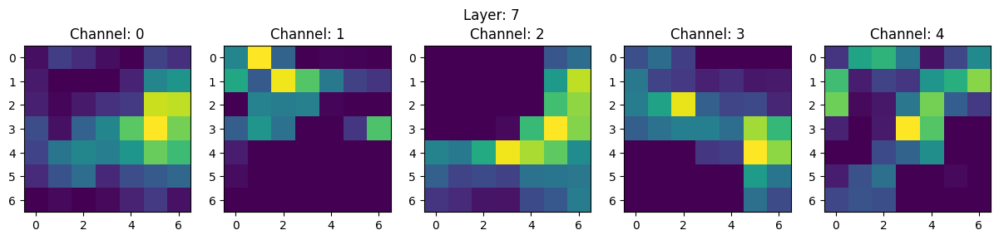

Layer: 0, Shape: torch.Size([1, 64, 112, 112])


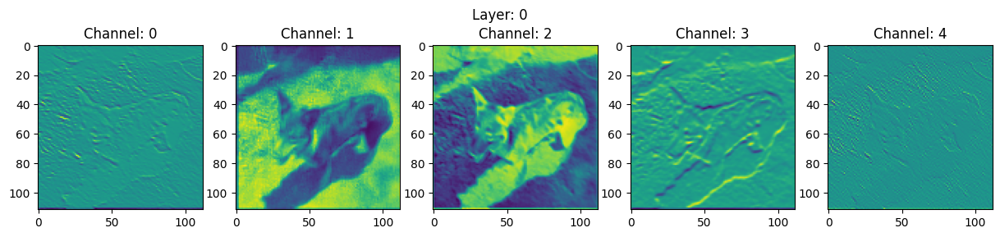

Layer: 1, Shape: torch.Size([1, 64, 112, 112])


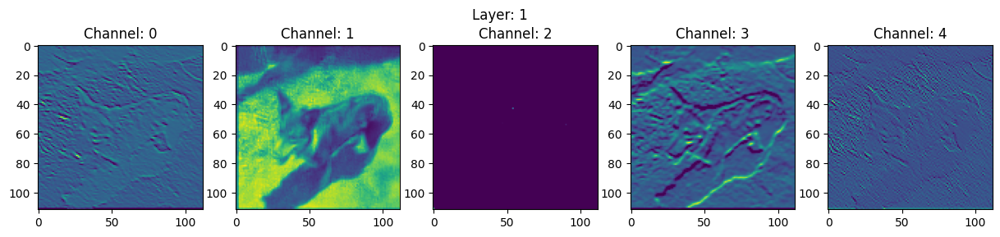

Layer: 2, Shape: torch.Size([1, 64, 112, 112])


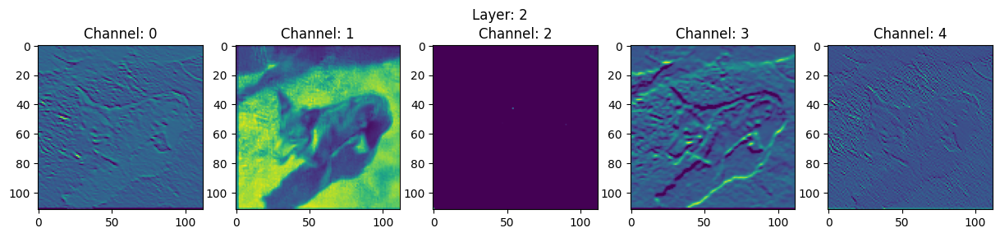

Layer: 3, Shape: torch.Size([1, 64, 56, 56])


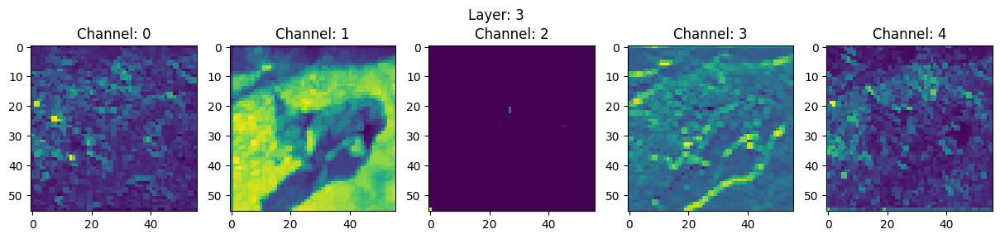

Layer: 4, Shape: torch.Size([1, 256, 56, 56])


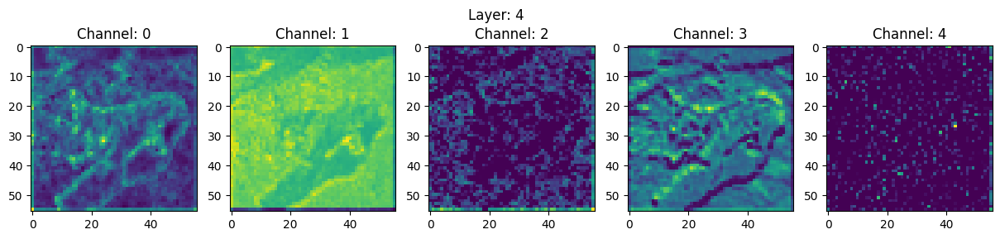

Layer: 5, Shape: torch.Size([1, 512, 28, 28])


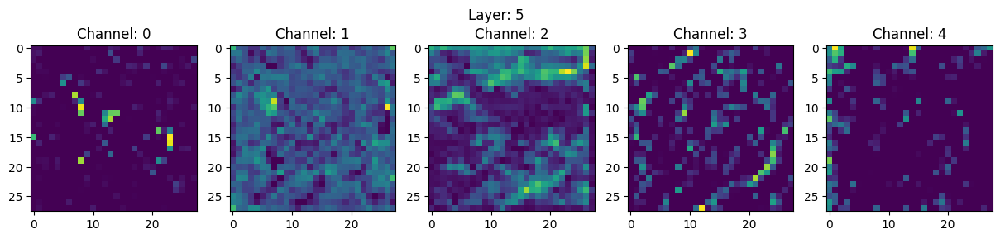

Layer: 6, Shape: torch.Size([1, 1024, 14, 14])


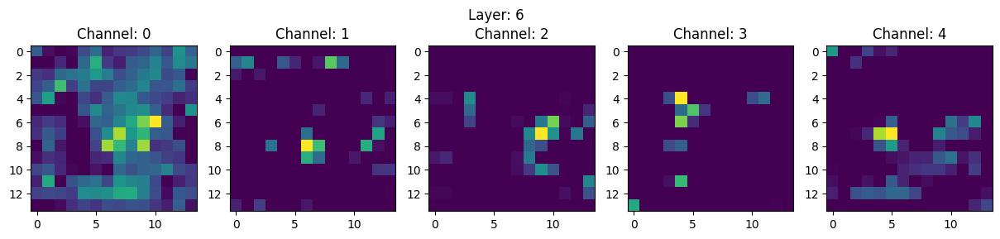

Layer: 7, Shape: torch.Size([1, 2048, 7, 7])


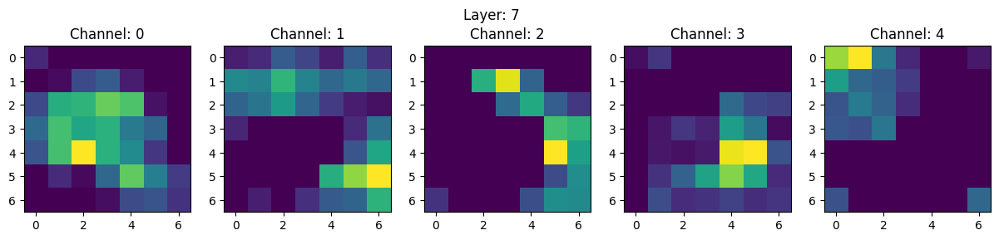

Layer: 0, Shape: torch.Size([1, 64, 112, 112])


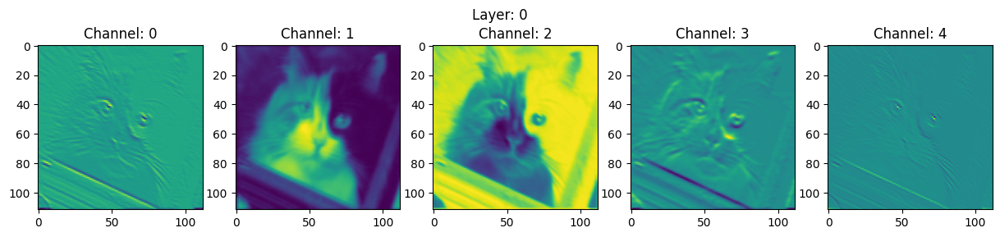

Layer: 1, Shape: torch.Size([1, 64, 112, 112])


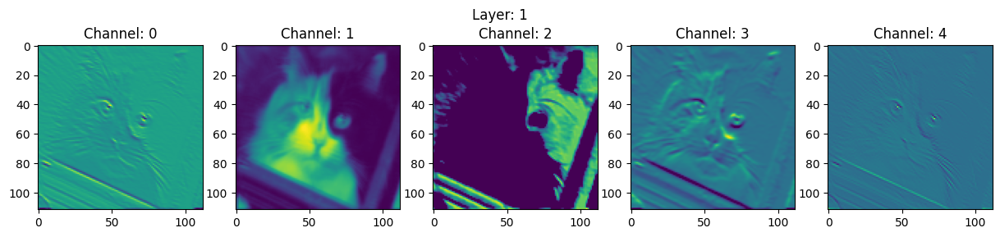

Layer: 2, Shape: torch.Size([1, 64, 112, 112])


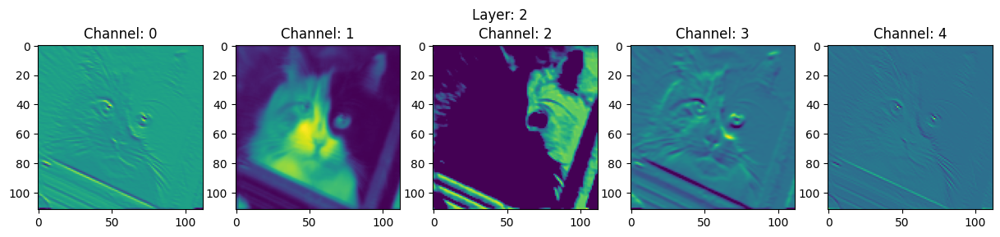

Layer: 3, Shape: torch.Size([1, 64, 56, 56])


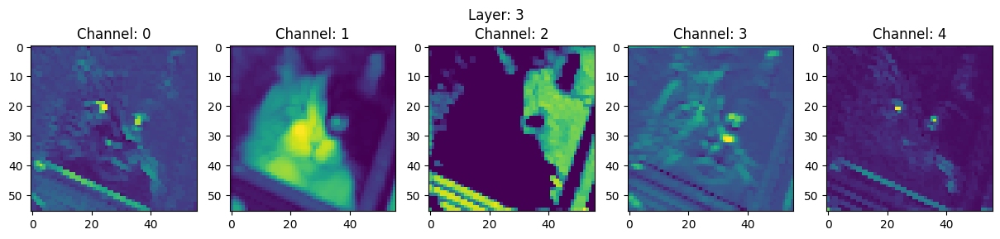

Layer: 4, Shape: torch.Size([1, 256, 56, 56])


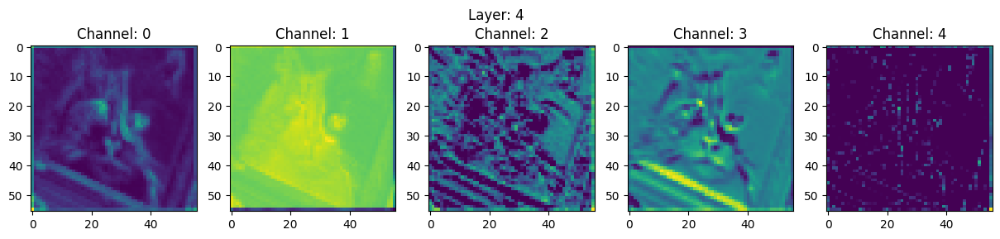

Layer: 5, Shape: torch.Size([1, 512, 28, 28])


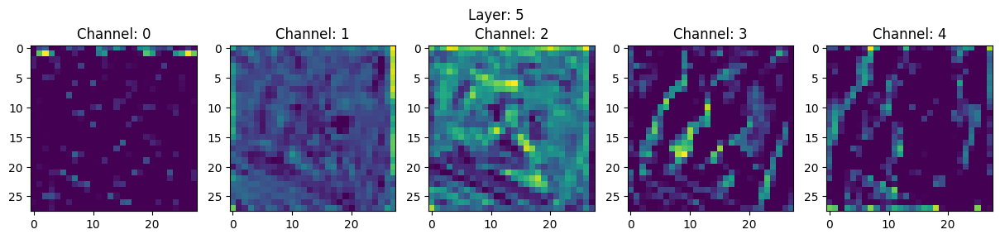

Layer: 6, Shape: torch.Size([1, 1024, 14, 14])


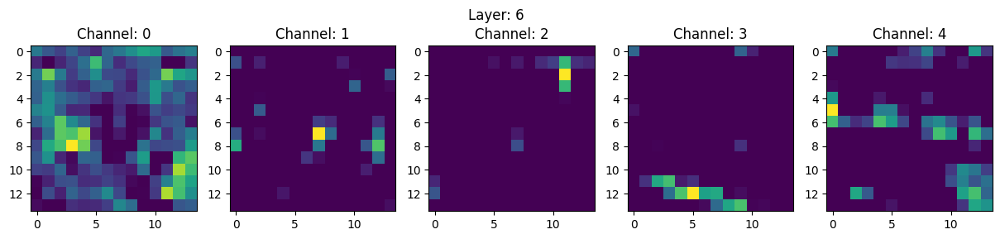

Layer: 7, Shape: torch.Size([1, 2048, 7, 7])


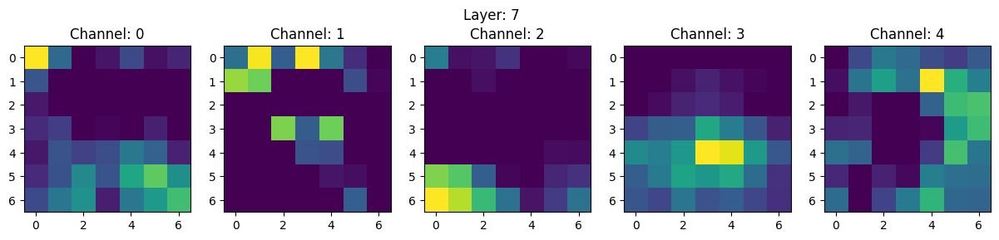

Layer: 0, Shape: torch.Size([1, 64, 112, 112])


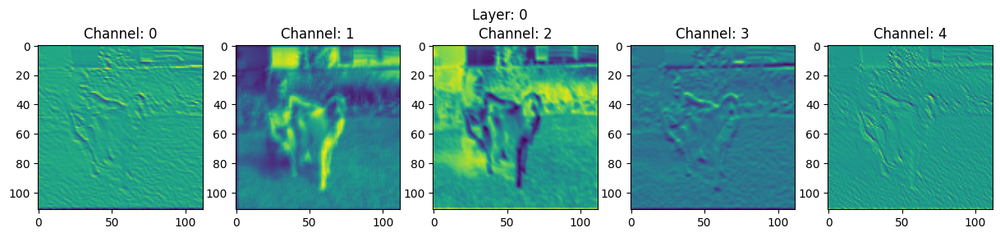

Layer: 1, Shape: torch.Size([1, 64, 112, 112])


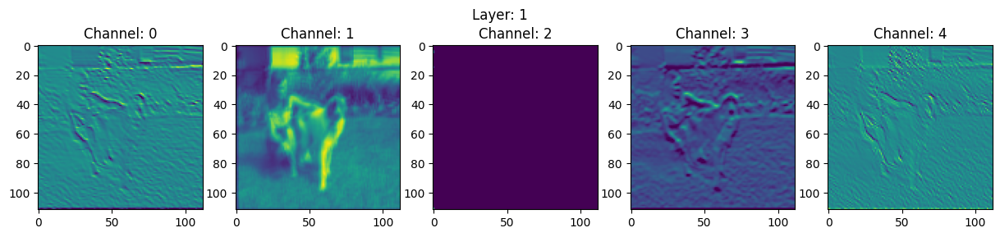

Layer: 2, Shape: torch.Size([1, 64, 112, 112])


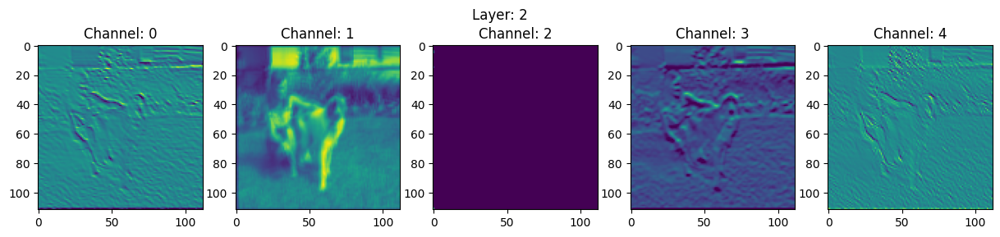

Layer: 3, Shape: torch.Size([1, 64, 56, 56])


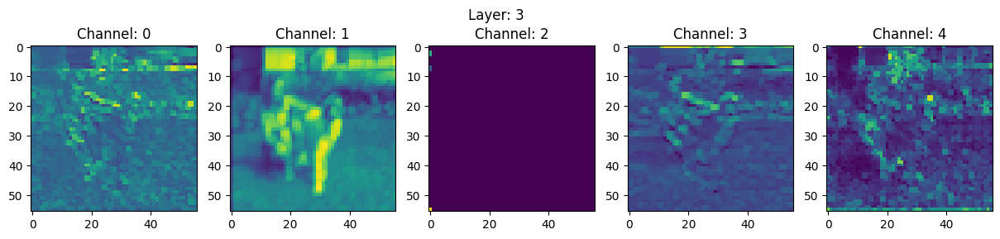

Layer: 4, Shape: torch.Size([1, 256, 56, 56])


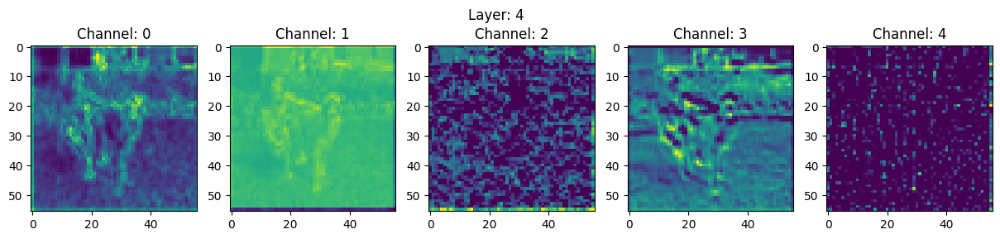

Layer: 5, Shape: torch.Size([1, 512, 28, 28])


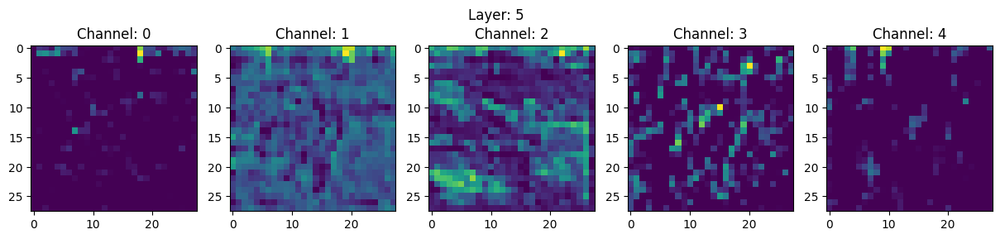

Layer: 6, Shape: torch.Size([1, 1024, 14, 14])


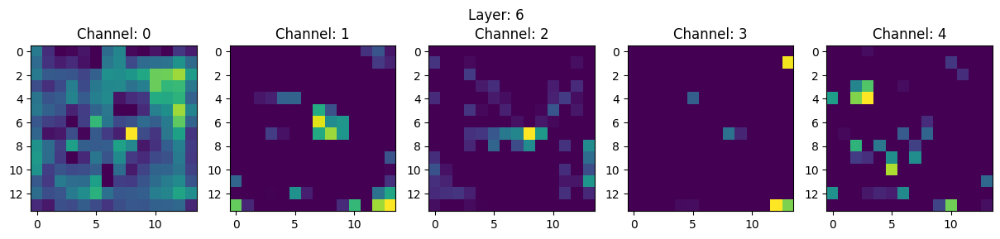

Layer: 7, Shape: torch.Size([1, 2048, 7, 7])


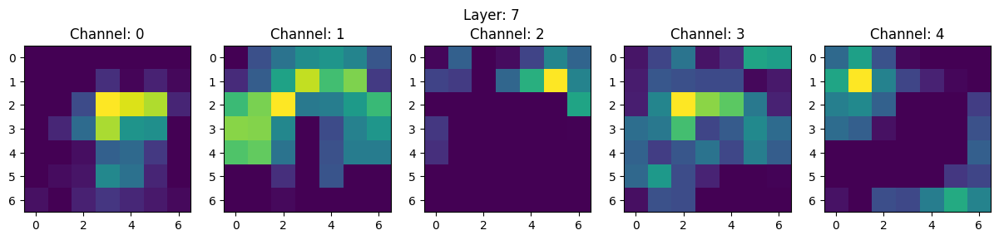

Layer: 0, Shape: torch.Size([1, 64, 112, 112])


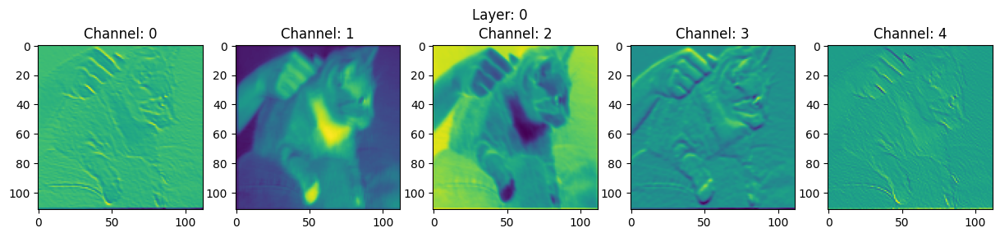

Layer: 1, Shape: torch.Size([1, 64, 112, 112])


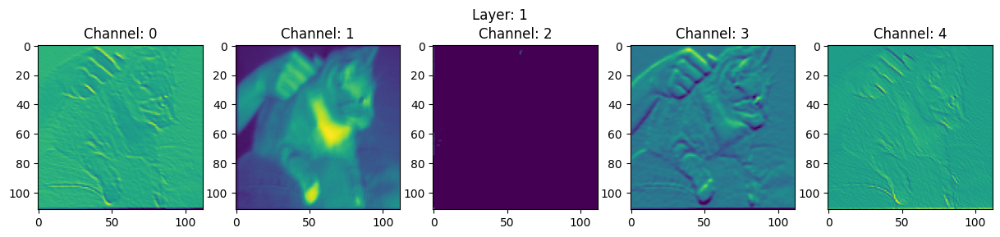

Layer: 2, Shape: torch.Size([1, 64, 112, 112])


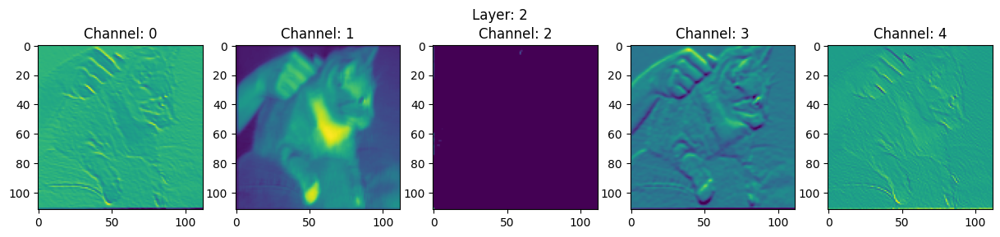

Layer: 3, Shape: torch.Size([1, 64, 56, 56])


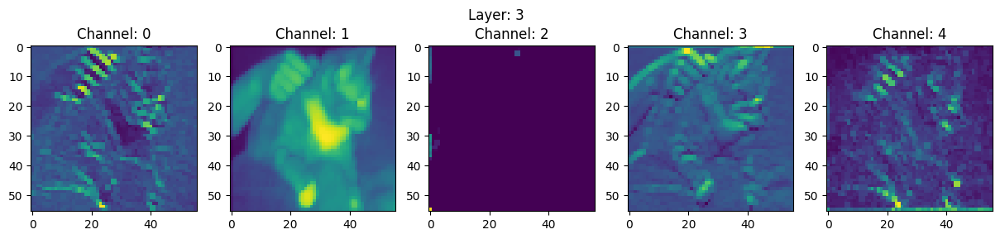

Layer: 4, Shape: torch.Size([1, 256, 56, 56])


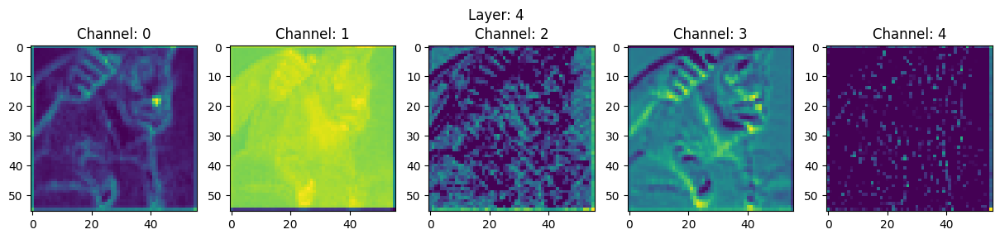

Layer: 5, Shape: torch.Size([1, 512, 28, 28])


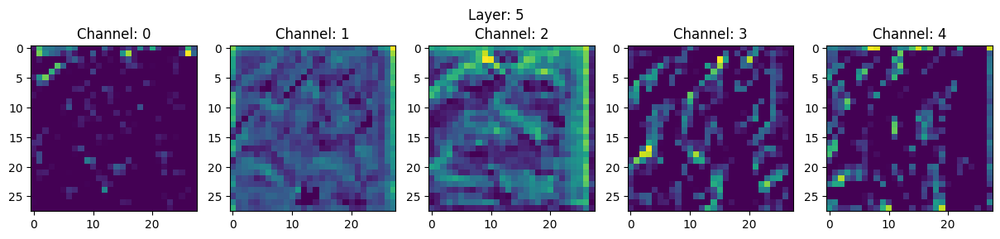

Layer: 6, Shape: torch.Size([1, 1024, 14, 14])


KeyboardInterrupt: 

In [26]:
for images, labels in dataloader:
    activations, hook = register_hooks(model)
    with torch.no_grad():
        output = model(images)
    hook.remove()

    for layer_name, activation in activations.items():
        print(f"Layer: {layer_name}, Shape: {activation.shape}")
        visualize_layer_output(layer_name, activation)

    # break
